In [1]:
import megatron as me
import pandas as pd
import numpy as np
from scipy.sparse import load_npz

/Users/huidong/anaconda3/envs/env_megatron/lib/python3.7/site-packages/umap/__init__.py:9: UserWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn("Tensorflow not installed; ParametricUMAP will be unavailable")


In [2]:
me.__version__

'0.1a'

In [3]:
workdir = 'result_larry_subset'
me.settings.set_workdir(workdir)

Saving results in: result_larry_subset


In [4]:
me.settings.set_figure_params(dpi=80,
                              style='white',
                              fig_size=[5,5],
                              rc={'image.cmap': 'viridis'})

In [5]:
mat_counts = load_npz('../input/raw/counts_matrix_in_vitro.npz')
mat_counts

<130887x25289 sparse matrix of type '<class 'numpy.float64'>'
	with 176867560 stored elements in Compressed Sparse Column format>

In [6]:
df_genes = pd.read_csv('../input/raw/gene_names_in_vitro.txt.gz', sep='\t',index_col=0,header=None)
df_genes.index.name = None
df_genes.head()

""
0610006L08Rik
0610007P14Rik
0610009B22Rik
0610009E02Rik
0610009L18Rik


In [7]:
metadata = pd.read_csv('../input/raw/cell_metadata_in_vitro.txt.gz', sep='\t')
metadata.head()

,Time point,Population,Annotation,Well
0,6.0,LK,undiff,2
1,6.0,LK,undiff,2
2,6.0,LK,Monocyte,2
3,6.0,LK,Neutrophil,2
4,6.0,LK,undiff,2


In [8]:
adata = me.AnnData(X=mat_counts, obs=metadata, var=pd.DataFrame(df_genes))

/Users/huidong/anaconda3/envs/env_megatron/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [9]:
adata

AnnData object with n_obs × n_vars = 130887 × 25289
    obs: 'Time point', 'Population', 'Annotation', 'Well'

In [10]:
mat_clones = load_npz('../input/raw/clone_annotation_in_vitro.npz')
mat_clones

<130887x5864 sparse matrix of type '<class 'numpy.bool_'>'
	with 49302 stored elements in Compressed Sparse Column format>

In [11]:
me.pp.add_clones(adata, 
                 mat=mat_clones)

In [12]:
adata

AnnData object with n_obs × n_vars = 130887 × 25289
    obs: 'Time point', 'Population', 'Annotation', 'Well'
    uns: 'clone'
    obsm: 'X_clone'

In [13]:
cells_subset = pd.read_csv('../input/processed/output_subset/metadata.tsv.gz',sep='\t',index_col=0)
adata_subset = adata[cells_subset.index,:].copy()
adata_subset

AnnData object with n_obs × n_vars = 3221 × 25289
    obs: 'Time point', 'Population', 'Annotation', 'Well'
    uns: 'clone'
    obsm: 'X_clone'

In [14]:
me.pp.filter_cells_rna(adata_subset,min_n_genes=100)
me.pp.filter_genes(adata_subset,min_n_cells=5)

before filtering: 
3221 cells,  25289 genes
filter cells based on min_n_genes
after filtering out low-quality cells: 
3221 cells,  25289 genes
Before filtering: 
3221 cells, 25289 genes
Filter genes based on min_n_cells
After filtering out low-expressed genes: 
3221 cells, 11350 genes


In [15]:
me.pp.cal_qc_rna(adata_subset)

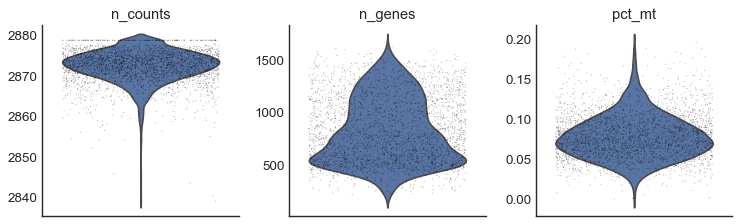

In [16]:
me.pl.violin(adata_subset,list_obs=['n_counts','n_genes','pct_mt'],alpha=0.3)

In [17]:
me.pp.normalize(adata_subset,method='lib_size')
me.pp.log_transform(adata_subset)

In [18]:
me.pp.select_variable_genes(adata_subset)

2000 variable genes are selected.


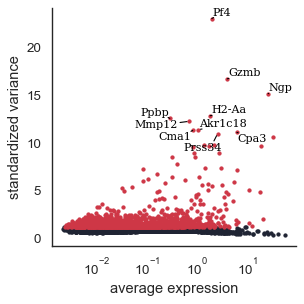

In [19]:
me.pl.variable_genes(adata_subset,show_texts=True)

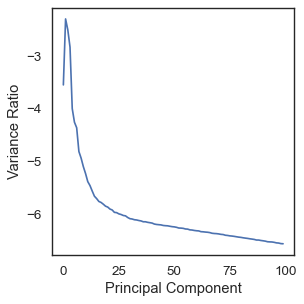

In [20]:
me.pp.pca(adata_subset,feature='highly_variable',n_components=100)
me.pl.pca_variance_ratio(adata_subset,show_cutoff=False)

the number of selected PC is: 50


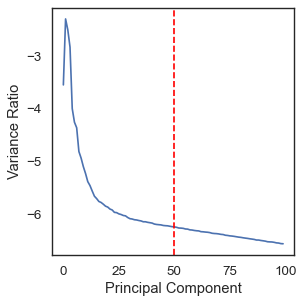

In [22]:
me.pp.select_pcs(adata_subset, n_pcs=50)
me.pl.pca_variance_ratio(adata_subset)

### regular umap

In [24]:
me.tl.umap(adata_subset,obsm='X_pca',n_dim=50, n_components=3)

In [25]:
adata_subset

AnnData object with n_obs × n_vars = 3221 × 11350
    obs: 'Time point', 'Population', 'Annotation', 'Well', 'n_counts', 'n_genes', 'pct_genes', 'pct_mt'
    var: 'n_counts', 'n_cells', 'pct_cells', 'variances_norm', 'variances', 'means', 'highly_variable'
    uns: 'clone', 'pca'
    obsm: 'X_clone', 'X_pca', 'X_umap'
    layers: 'raw'

In [26]:
adata_subset.obs['Time point'] = adata_subset.obs['Time point'].astype(str)

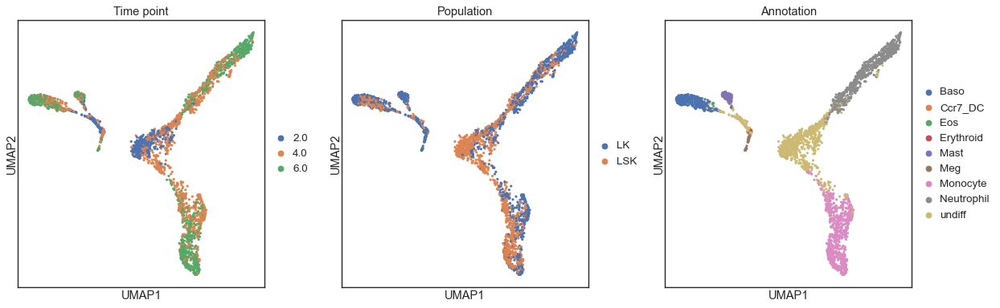

In [27]:
me.pl.umap(adata_subset,color=['Time point','Population','Annotation'],drawing_order='random')

In [28]:
me.pl.scatter_3d(adata_subset,obsm='X_umap', color=['Time point', 'Annotation'])

### DensMAP

In [32]:
me.tl.umap(adata_subset,obsm='X_pca',n_dim=50, n_components=3, densmap=True)

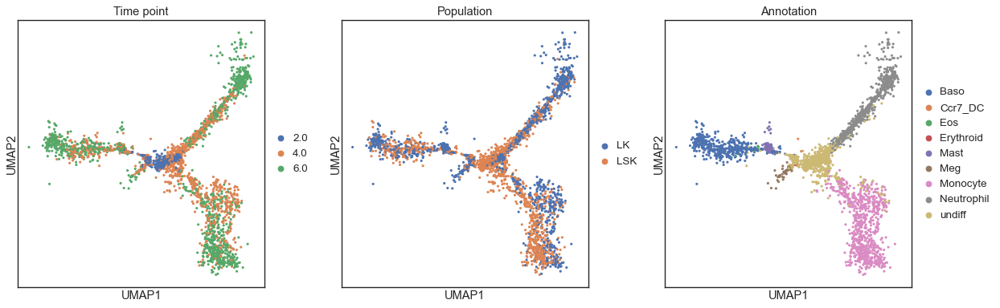

In [33]:
me.pl.umap(adata_subset,color=['Time point','Population','Annotation'],drawing_order='random')

In [34]:
me.pl.scatter_3d(adata_subset,obsm='X_umap', color=['Time point', 'Annotation'])